We will use the daily spreadsheet from EU CDC containing new cases and deaths per country per day.

In [2]:
!rm COVID-19-geographic-disbtribution-worldwide.xlsx
!wget https://www.ecdc.europa.eu/sites/default/files/documents/COVID-19-geographic-disbtribution-worldwide.xlsx

--2020-05-05 17:34:18--  https://www.ecdc.europa.eu/sites/default/files/documents/COVID-19-geographic-disbtribution-worldwide.xlsx
Resolving www.ecdc.europa.eu (www.ecdc.europa.eu)... 13.227.198.54, 13.227.198.98, 13.227.198.44, ...
Connecting to www.ecdc.europa.eu (www.ecdc.europa.eu)|13.227.198.54|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 709727 (693K) [application/vnd.openxmlformats-officedocument.spreadsheetml.sheet]
Saving to: ‘COVID-19-geographic-disbtribution-worldwide.xlsx’

COVID-19-geographic 100%[===================>] 693.09K  --.-KB/s    in 0.1s    

2020-05-05 17:34:18 (5.98 MB/s) - ‘COVID-19-geographic-disbtribution-worldwide.xlsx’ saved [709727/709727]



Get Pandas and NumPy for feature engineering and calculations and get plots inline.

In [3]:
import pandas as pd
import numpy  as np

%matplotlib inline

We read our dataframe directly from the downloaded Excel file and have a look at the first 10 lines for format. Data for Namibia caused missing values because the `geoId` is __NA__, so we disable interpretation of missing values.

In [4]:
df = pd.read_excel('COVID-19-geographic-disbtribution-worldwide.xlsx', na_filter=False)
df.head(10)

,dateRep,day,month,year,cases,deaths,countriesAndTerritories,geoId,countryterritoryCode,popData2018,continentExp
0,2020-05-05,5,5,2020,190,5,Afghanistan,AF,AFG,37172386,Asia
1,2020-05-04,4,5,2020,235,13,Afghanistan,AF,AFG,37172386,Asia
2,2020-05-03,3,5,2020,134,4,Afghanistan,AF,AFG,37172386,Asia
3,2020-05-02,2,5,2020,164,4,Afghanistan,AF,AFG,37172386,Asia
4,2020-05-01,1,5,2020,222,4,Afghanistan,AF,AFG,37172386,Asia
5,2020-04-30,30,4,2020,122,0,Afghanistan,AF,AFG,37172386,Asia
6,2020-04-29,29,4,2020,124,3,Afghanistan,AF,AFG,37172386,Asia
7,2020-04-28,28,4,2020,172,0,Afghanistan,AF,AFG,37172386,Asia
8,2020-04-27,27,4,2020,68,10,Afghanistan,AF,AFG,37172386,Asia
9,2020-04-26,26,4,2020,112,4,Afghanistan,AF,AFG,37172386,Asia


To make room in the dataframe for future predictions, we add columns for those values and set them to missing for now.

In [5]:
df['pcases']  = np.nan
df['pdeaths'] = np.nan

Last check of our source dataframe.

In [6]:
df.count()

dateRep                    15074
day                        15074
month                      15074
year                       15074
cases                      15074
deaths                     15074
countriesAndTerritories    15074
geoId                      15074
countryterritoryCode       15074
popData2018                15074
continentExp               15074
pcases                         0
pdeaths                        0
dtype: int64

We pivot to a country by column format.

In [7]:
df_geo = df.pivot(index='dateRep', columns='geoId', values=['cases', 'deaths', 'pcases', 'pdeaths'])
df_geo

cases                                                        ...  \
geoId         AD     AE     AF   AG   AI   AL     AM   AO     AR    AT  ...   
dateRep                                                                 ...   
2019-12-31   NaN    0.0    0.0  NaN  NaN  NaN    0.0  NaN    NaN   0.0  ...   
2020-01-01   NaN    0.0    0.0  NaN  NaN  NaN    0.0  NaN    NaN   0.0  ...   
2020-01-02   NaN    0.0    0.0  NaN  NaN  NaN    0.0  NaN    NaN   0.0  ...   
2020-01-03   NaN    0.0    0.0  NaN  NaN  NaN    0.0  NaN    NaN   0.0  ...   
2020-01-04   NaN    0.0    0.0  NaN  NaN  NaN    0.0  NaN    NaN   0.0  ...   
...          ...    ...    ...  ...  ...  ...    ...  ...    ...   ...  ...   
2020-05-01   2.0  552.0  222.0  0.0  0.0  7.0  134.0  0.0  143.0  93.0  ...   
2020-05-02   1.0  557.0  164.0  1.0  0.0  9.0   82.0  2.0  104.0  74.0  ...   
2020-05-03   1.0  561.0  134.0  0.0  0.0  7.0  125.0  6.0  149.0  27.0  ...   
2020-05-04   1.0  564.0  235.0  0.0  0.0  6.0  113.0  0.0  102.0  39.0  ...   
2020-05-05   2.0  567.0  190.0  0.0  0.0  8.0  121.0  0.0  104.0  24.0  ...   

           pdeaths                                      
geoId           VC  VE  VG  VI  VN  XK  YE  ZA  ZM  ZW  
dateRep                                                 
2019-12-31     NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN  
2020-01-01     NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN  
2020-01-02     NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN  
2020-01-03     NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN  
2020-01-04     NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN  
...            ...  ..  ..  ..  ..  ..  ..  ..  ..  ..  
2020-05-01     NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN  
2020-05-02     NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN  
2020-05-03     NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN  
2020-05-04     NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN  
2020-05-05     NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN  

[127 rows x 836 columns]

For predictions later on we need extra rows in our dataframe. One of the ways to do that is reindexing with a larger range, so we use the current range and add 100 days and check our latest date.

In [8]:
new_index = pd.date_range(df_geo.index.min(), df_geo.index.max() + pd.Timedelta('100 days'))
df_geo = df_geo.reindex(new_index)
df_geo.describe()

cases                                                           \
geoId         AD          AE          AF         AG         AI         AL   
count  53.000000  121.000000  117.000000  47.000000  40.000000  58.000000   
mean   14.150943  121.735537   24.735043   0.531915   0.075000  13.844828   
std    12.799333  201.942350   47.898851   1.265788   0.349908   8.233014   
min     0.000000    0.000000    0.000000   0.000000   0.000000   0.000000   
25%     2.000000    0.000000    0.000000   0.000000   0.000000   7.250000   
50%    11.000000    0.000000    0.000000   0.000000   0.000000  12.500000   
75%    22.000000  277.000000   33.000000   0.000000   0.000000  19.750000   
max    43.000000  567.000000  235.000000   6.000000   2.000000  34.000000   

                                                       ... pdeaths            \
geoId          AM         AO          AR           AT  ...      VC   VE   VG   
count  118.000000  45.000000   60.000000   127.000000  ...     0.0  0.0  0.0   
mean    21.245763   0.777778   81.233333   123.000000  ...     NaN  NaN  NaN   
std     31.744691   1.396243   69.065522   217.403107  ...     NaN  NaN  NaN   
min      0.000000   0.000000    0.000000     0.000000  ...     NaN  NaN  NaN   
25%      0.000000   0.000000   11.750000     0.000000  ...     NaN  NaN  NaN   
50%      0.000000   0.000000   83.500000     4.000000  ...     NaN  NaN  NaN   
75%     39.750000   1.000000  125.000000   139.500000  ...     NaN  NaN  NaN   
max    134.000000   6.000000  344.000000  1141.000000  ...     NaN  NaN  NaN   

                                          
geoId   VI   VN   XK   YE   ZA   ZM   ZW  
count  0.0  0.0  0.0  0.0  0.0  0.0  0.0  
mean   NaN  NaN  NaN  NaN  NaN  NaN  NaN  
std    NaN  NaN  NaN  NaN  NaN  NaN  NaN  
min    NaN  NaN  NaN  NaN  NaN  NaN  NaN  
25%    NaN  NaN  NaN  NaN  NaN  NaN  NaN  
50%    NaN  NaN  NaN  NaN  NaN  NaN  NaN  
75%    NaN  NaN  NaN  NaN  NaN  NaN  NaN  
max    NaN  NaN  NaN  NaN  NaN  NaN  NaN  

[8 rows x 836 columns]

Most algorithms take numerical data as inputs for a model, so we add a column representing the date as days since January 1st, 2019. To access the date values in the index easily, we first create a separate column.

In [9]:
df_geo['dateRep'] = df_geo.index
df_geo['daynum'] = (df_geo['dateRep'] - pd.Timestamp('2019-01-01')).dt.days.astype('int')
df_geo['daynum'].describe()

count    227.000000
mean     477.000000
std       65.673435
min      364.000000
25%      420.500000
50%      477.000000
75%      533.500000
max      590.000000
Name: daynum, dtype: float64

Now for some modeling! The _curve_ can also be interpreted as a smoothed version of the new arriving cases, because using the sum over the last 14 days is just the mean times 14. It has the general shape of a gaussian curve, based on the underlying probability distribution of the disease spread. Gaussian curves have the nice property that the logarithm is a parabola, as we can check for a couple of countries.

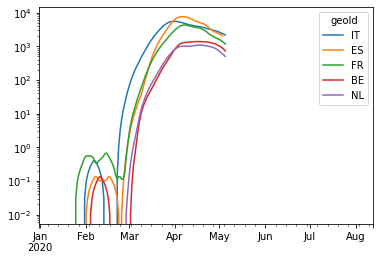

In [10]:
(df_geo['cases'][['IT', 'ES', 'FR', 'BE', 'NL']].rolling(14, win_type='triang').mean()).plot(logy=True)

We create a simple dataframe to contain the source values for our fitting algorithm, with a rolling window to smooth out the target because of the reporting cycle where many of the cases over the weekend end up in the reported data for Tuesdays and Wednesdays. To ignore the noise of early cases before the outbreak we select only those days where the number is above 100 and take the logarithm.

Now we can use polynomial regression to estimate the curve with `polyfit`. We are looking for a parabola, so we use a second order approximation. The outputs are factors a, b, and c for the function `ax^2 + bx + c`. Our fit function cannot handle missing values, but they are already filtered out in the selection above.

The `polyval` function takes the results of `polyfit` and applies them to input data. Once we have the resulting values, we take the exponential and we get the estimated curve.

Now that we have a curve fitted, we can see where the cumulative number will end up if none of our assumptions change, which is rarely the case.

In [12]:
# Suppress warnings on memory usage of multiple plots

import matplotlib as mpl
mpl.rc('figure', max_open_warning=0)

446 factors [ 2.13942440e-03 -1.81195494e+00  3.85376485e+02] residuals 0.026871602983443234
447 factors [ 6.90753539e-05  1.03662871e-02 -1.56091316e+01] residuals 0.03716911858163681
448 factors [-1.71409351e-03  1.58133806e+00 -3.61599170e+02] residuals 0.0499006021842353
449 factors [-1.26437258e-03  1.18477414e+00 -2.74181516e+02] residuals 0.05119628962824361
450 factors [-1.27143444e-03  1.19100694e+00 -2.75556695e+02] residuals 0.05119678337980343
451 factors [-1.07672869e-03  1.01900388e+00 -2.37572601e+02] residuals 0.0517597972654577
452 factors [-9.12880499e-04  8.74129308e-01 -2.05550733e+02] residuals 0.05234251080769213
453 factors [-1.06404556e-03  1.00791039e+00 -2.35147038e+02] residuals 0.05305107077095657
454 factors [-1.38169171e-03  1.28928134e+00 -2.97450153e+02] residuals 0.05743122065064589
455 factors [-1.97156262e-03  1.81226090e+00 -4.13355187e+02] residuals 0.07820035774004985
456 factors [-2.39527772e-03  2.18826567e+00 -4.96761216e+02] residuals 0.0926991

536 factors [-1.13612062e-03  1.05642451e+00 -2.42497856e+02] residuals 0.6485373356970908
537 factors [-1.13612062e-03  1.05642451e+00 -2.42497856e+02] residuals 0.6485373356970908
538 factors [-1.13612062e-03  1.05642451e+00 -2.42497856e+02] residuals 0.6485373356970908
539 factors [-1.13612062e-03  1.05642451e+00 -2.42497856e+02] residuals 0.6485373356970908
540 factors [-1.13612062e-03  1.05642451e+00 -2.42497856e+02] residuals 0.6485373356970908
541 factors [-1.13612062e-03  1.05642451e+00 -2.42497856e+02] residuals 0.6485373356970908
542 factors [-1.13612062e-03  1.05642451e+00 -2.42497856e+02] residuals 0.6485373356970908
543 factors [-1.13612062e-03  1.05642451e+00 -2.42497856e+02] residuals 0.6485373356970908
544 factors [-1.13612062e-03  1.05642451e+00 -2.42497856e+02] residuals 0.6485373356970908
545 factors [-1.13612062e-03  1.05642451e+00 -2.42497856e+02] residuals 0.6485373356970908
546 factors [-1.13612062e-03  1.05642451e+00 -2.42497856e+02] residuals 0.6485373356970908

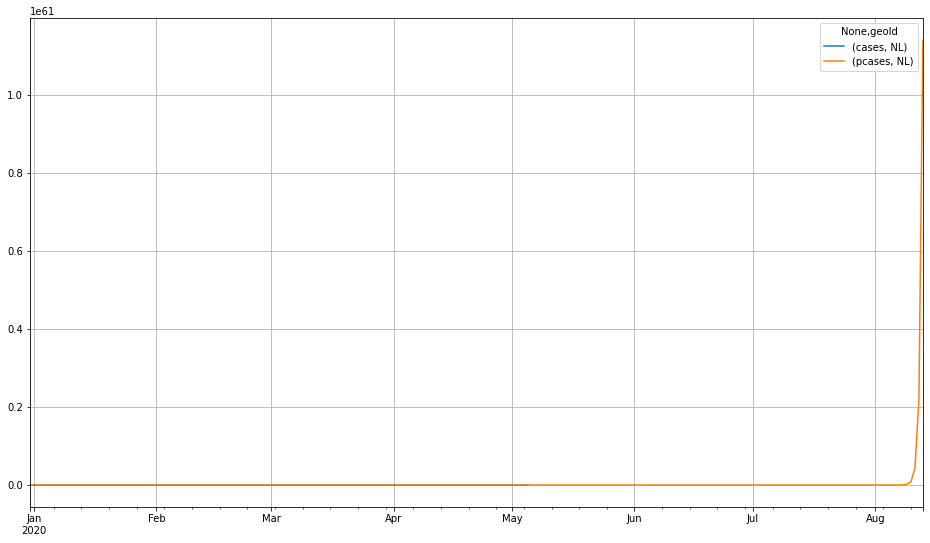

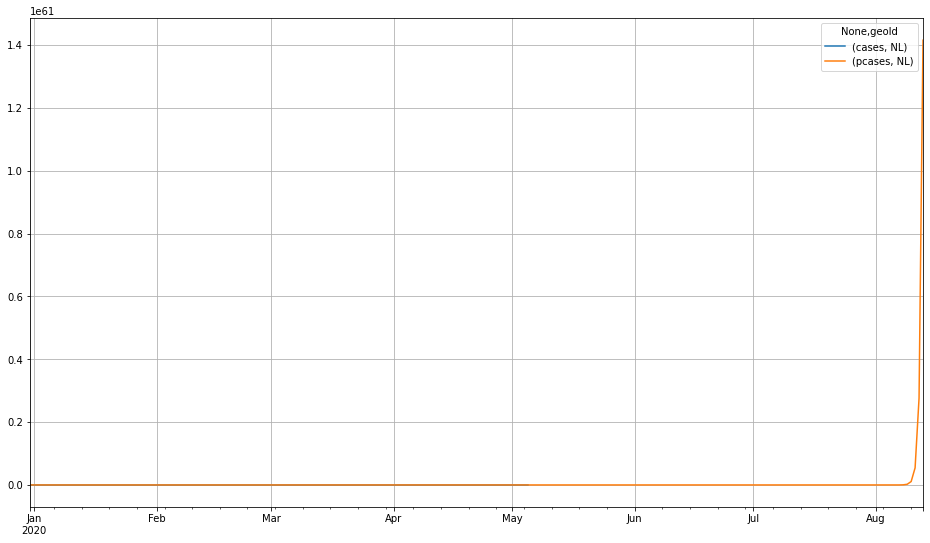

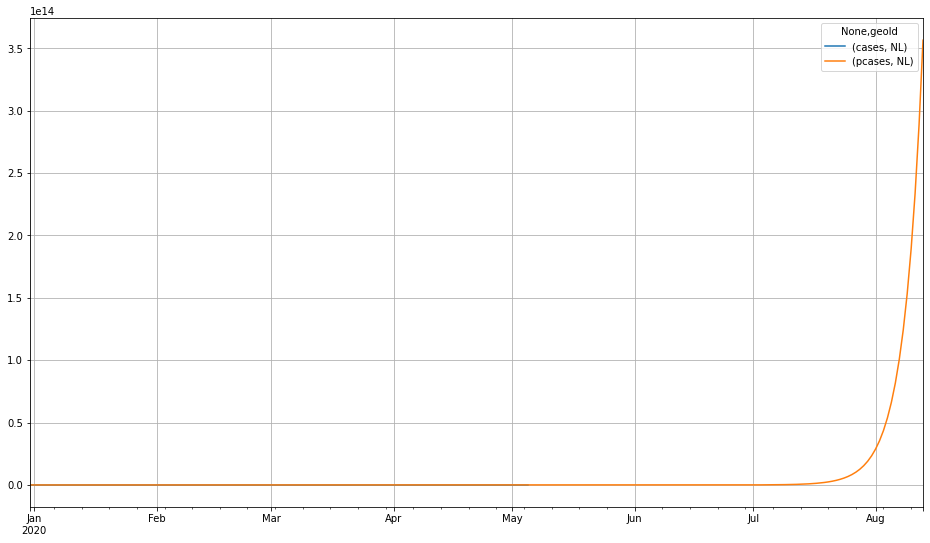

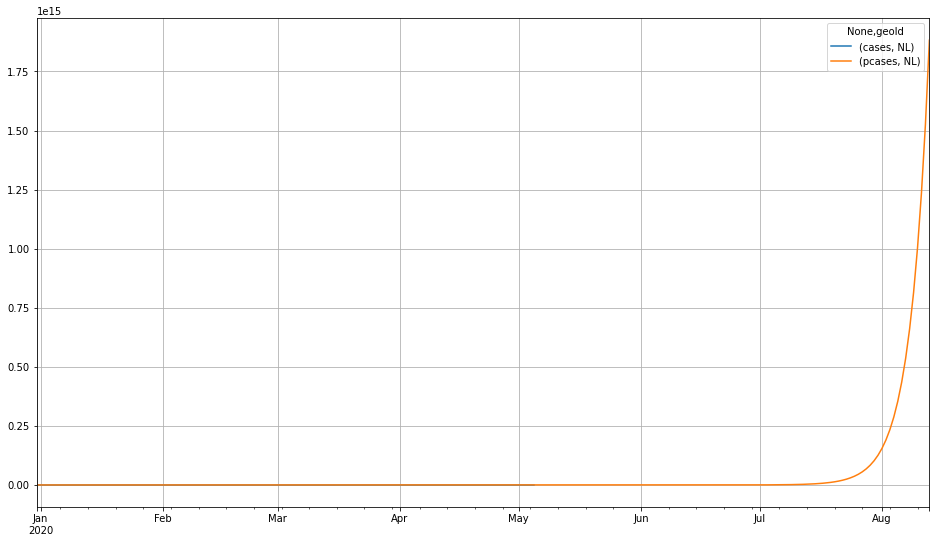

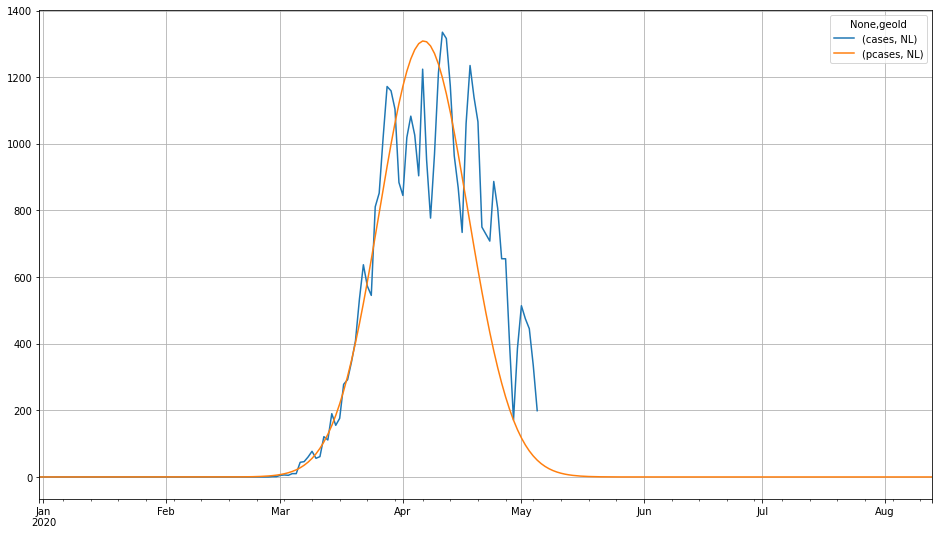

...

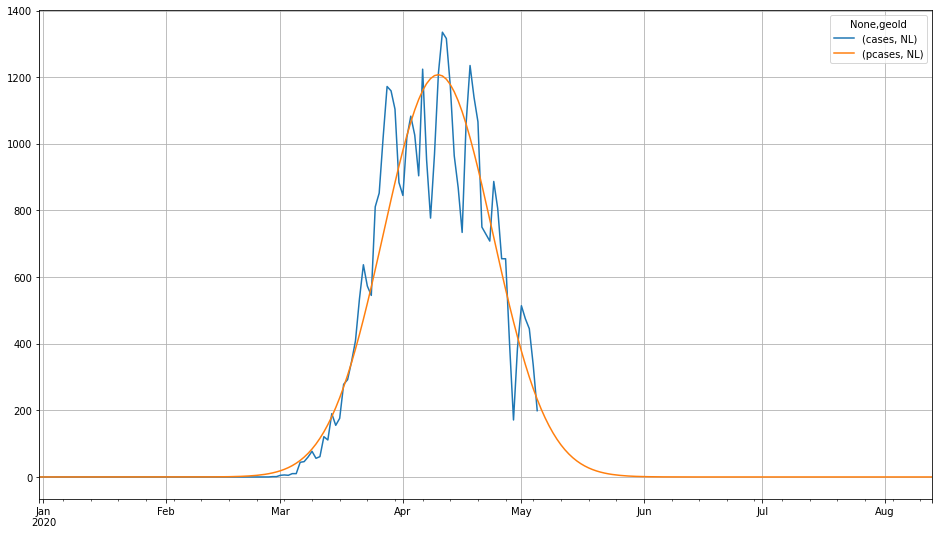

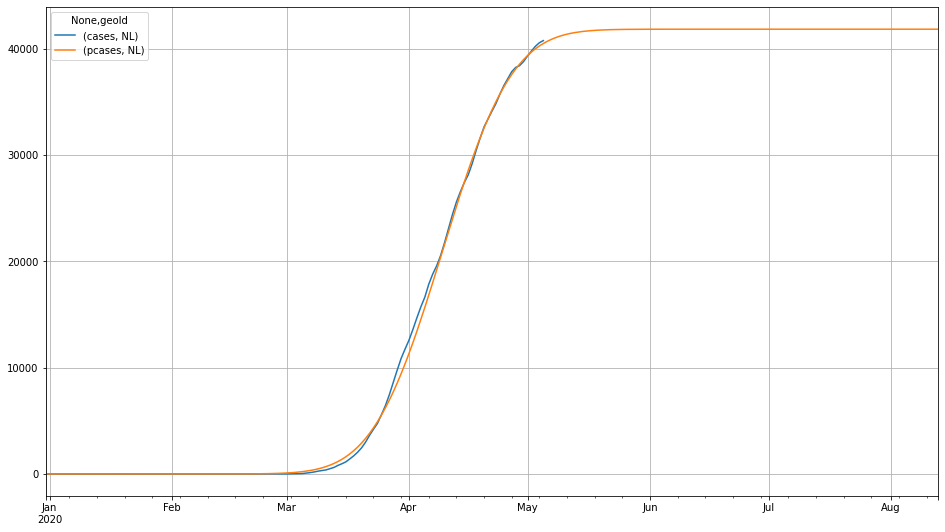

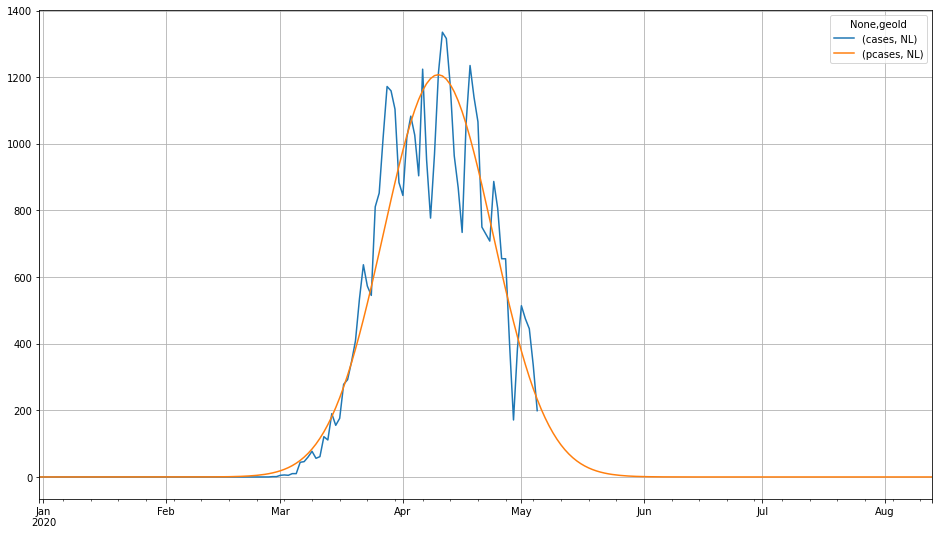

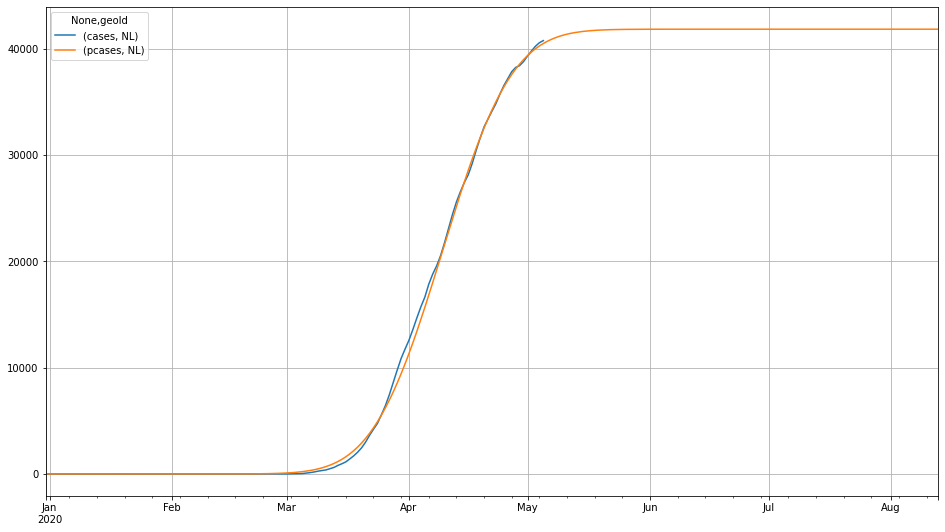

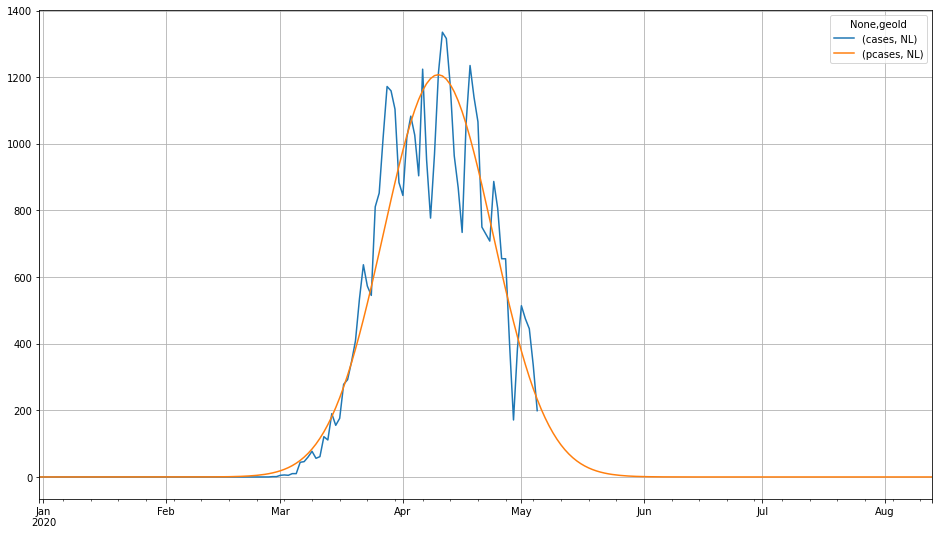

In [ ]:
# countries = df['geoId'].unique()

countries = ['JP', 'RU', 'US', 'BR', 'AT', 'CH', 'DE', 'IT', 'ES', 'FR', 'SE', 'UK', 'IE', 'BE', 'NL']

country = 'NL'
measure = 'cases'
pmeasure = 'pcases'

for lastdate in df_geo['daynum']:
    df_pred = pd.DataFrame({'x':df_geo['daynum'], 'y':df_geo[measure][country]})
    df_pred = df_pred[df_pred['x'] <= lastdate]
    df_pred = df_pred[df_pred['y'] > 100]
    df_pred['y'] = np.log10(df_pred['y'])
    if len(df_pred) > 10:
        fit = np.polyfit(x=df_pred['x'], y=df_pred['y'], deg=2, full=True)
        df_geo[(pmeasure, country)] = 10 ** np.polyval(fit[0], df_geo['daynum'])
        print(lastdate, "factors", fit[0], "residuals", fit[1][0])
        df_geo[[(measure, country), (pmeasure, country)]].plot(figsize=(16, 9), grid=True)
        df_geo[[(measure, country), (pmeasure, country)]].cumsum().plot(figsize=(16, 9), grid=True)

Keep exploring! Stay home, wash your hands, keep your distance.